# Imports

In [112]:
import pandas as pd 
import cv2
import numpy as np
from matplotlib import pyplot as plt
import regex as re
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

# Kaggle API

In [2]:
# from google.colab import files

# uploaded = files.upload()

# for fn in uploaded.keys():
#   print('User uploaded file "{name}" with length {length} bytes'.format(
#       name=fn, length=len(uploaded[fn])))
  
# # Then move kaggle.json into the folder where the API expects to find it.
# !mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

In [3]:
# !kaggle competitions download -c football-match-probability-prediction

In [4]:
# !unzip football-match-probability-prediction

# Preprocessing

## Reading the Data

In [6]:
def convert_dtype(x):
    if not x:
        return ''
    try:
        return str(x)   
    except:        
        return ''


In [94]:
matches_df = pd.read_csv(r"D:\Uni\Semester 10\Big Data\Project\data\train.csv",converters={'is_cup': convert_dtype})
matches_df.head()

,id,target,home_team_name,away_team_name,match_date,league_name,league_id,is_cup,home_team_coach_id,away_team_coach_id,...,away_team_history_league_id_1,away_team_history_league_id_2,away_team_history_league_id_3,away_team_history_league_id_4,away_team_history_league_id_5,away_team_history_league_id_6,away_team_history_league_id_7,away_team_history_league_id_8,away_team_history_league_id_9,away_team_history_league_id_10
0,11906497,away,Newell's Old Boys,River Plate,2019-12-01 00:45:00,Superliga,636,False,468196.0,468200.0,...,1122.0,642.0,636.0,636.0,636.0,1122.0,636.0,642.0,636.0,1122.0
1,11984383,home,Real Estelí,Deportivo Las Sabanas,2019-12-01 01:00:00,Primera Division,752,False,516788.0,22169161.0,...,752.0,752.0,752.0,752.0,752.0,752.0,752.0,752.0,752.0,752.0
2,11983301,draw,UPNFM,Marathón,2019-12-01 01:00:00,Liga Nacional,734,False,2510608.0,456313.0,...,734.0,734.0,734.0,734.0,734.0,734.0,734.0,734.0,734.0,734.0
3,11983471,away,León,Morelia,2019-12-01 01:00:00,Liga MX,743,False,1552508.0,465797.0,...,743.0,743.0,743.0,743.0,743.0,743.0,743.0,743.0,746.0,743.0
4,11883005,home,Cobán Imperial,Iztapa,2019-12-01 01:00:00,Liga Nacional,705,False,429958.0,426870.0,...,705.0,705.0,705.0,705.0,705.0,705.0,705.0,705.0,705.0,705.0


In [9]:
# targets_df = pd.read_csv("train_target_and_scores.csv")
# targets_df

In [350]:
len(matches_df["home_team_coach_id"].unique())

8805

In [351]:
len(matches_df["away_team_coach_id"].unique())

8939

In [10]:
matches_df.describe()

,id,league_id,home_team_coach_id,away_team_coach_id,home_team_history_is_play_home_1,home_team_history_is_play_home_2,home_team_history_is_play_home_3,home_team_history_is_play_home_4,home_team_history_is_play_home_5,home_team_history_is_play_home_6,...,away_team_history_league_id_1,away_team_history_league_id_2,away_team_history_league_id_3,away_team_history_league_id_4,away_team_history_league_id_5,away_team_history_league_id_6,away_team_history_league_id_7,away_team_history_league_id_8,away_team_history_league_id_9,away_team_history_league_id_10
count,1.109380e+05,110938.000000,8.921700e+04,8.912300e+04,109779.000000,108487.000000,107165.000000,105837.000000,104461.000000,103042.000000,...,109712.000000,108345.000000,106904.000000,105422.000000,103938.000000,102512.000000,101071.000000,99643.000000,98176.000000,96722.000000
mean,1.519875e+07,910.457012,1.287134e+07,1.291552e+07,0.306944,0.567801,0.466141,0.519469,0.487857,0.507288,...,901.986200,894.389137,886.368012,878.243611,869.450297,861.901455,853.435338,844.673223,837.678200,829.177374
std,2.536393e+06,549.120985,1.578479e+07,1.580344e+07,0.461228,0.495384,0.498855,0.499623,0.499855,0.499949,...,545.826707,542.247411,538.497274,534.864981,531.170701,527.338931,524.217968,520.954647,517.647869,514.900676
min,1.142829e+07,2.000000,2.000000e+00,2.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
25%,1.200038e+07,444.000000,4.596120e+05,4.595650e+05,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,438.000000,432.000000,426.000000,420.000000,417.000000,408.000000,399.000000,391.500000,387.000000,387.000000
50%,1.675988e+07,947.000000,1.552728e+06,1.552806e+06,0.000000,1.000000,0.000000,1.000000,0.000000,1.000000,...,944.000000,935.000000,906.500000,899.000000,884.000000,881.000000,860.000000,830.000000,821.000000,806.000000
75%,1.724230e+07,1293.000000,3.243116e+07,3.279539e+07,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1286.000000,1283.000000,1279.000000,1274.000000,1270.000000,1267.000000,1265.000000,1263.000000,1261.000000,1255.000000
max,1.805384e+07,2039.000000,3.756849e+07,3.756847e+07,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,2039.000000,2039.000000,2039.000000,2039.000000,2039.000000,2039.000000,2039.000000,2039.000000,2028.000000,2025.000000


<hr>
<hr>

# Visualizations and Plots:

<hr>


In [337]:
plt.rc('font', size=12) 
plt.rc('axes', titlesize=14)
plt.rc('axes', labelsize=12) 
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12) 
plt.rc('legend', fontsize=12) 
plt.rc('figure', titlesize=14) 
plt.rcParams['figure.dpi'] = 150
sns.set_style("whitegrid")

colors = ["windows blue", "amber", "greyish", "faded green", "dusty purple"]
sns.set_palette(sns.xkcd_palette(colors))

In [155]:
matches_df.columns

Index(['id', 'target', 'home_team_name', 'away_team_name', 'match_date',
       'league_name', 'league_id', 'is_cup', 'home_team_coach_id',
       'away_team_coach_id',
       ...
       'away_team_history_league_id_1', 'away_team_history_league_id_2',
       'away_team_history_league_id_3', 'away_team_history_league_id_4',
       'away_team_history_league_id_5', 'away_team_history_league_id_6',
       'away_team_history_league_id_7', 'away_team_history_league_id_8',
       'away_team_history_league_id_9', 'away_team_history_league_id_10'],
      dtype='object', length=190)

### Converting string dates to datetime

In [45]:
print(matches_df.match_date.dtype)
matches_df['match_date'] = pd.to_datetime(matches_df['match_date'], format='%Y-%m-%d %H:%M')
print(matches_df.match_date.dtype)
matches_df['match_date'] 

datetime64[ns]


0        2019-12-01 00:45:00
1        2019-12-01 01:00:00
2        2019-12-01 01:00:00
3        2019-12-01 01:00:00
4        2019-12-01 01:00:00
                 ...        
110933   2021-04-30 23:00:00
110934   2021-04-30 23:00:00
110935   2021-04-30 23:00:00
110936   2021-05-01 00:00:00
110937   2021-05-01 00:00:00
Name: match_date, Length: 110938, dtype: datetime64[ns]

In [137]:
def str_to_date(df,col):
    df[col] = pd.to_datetime(df[col], format='%Y-%m-%d %H:%M')
    return df

In [142]:
matches_df = str_to_date(matches_df,"match_date")
matches_df["match_date"]

0        2019-12-01 00:45:00
1        2019-12-01 01:00:00
2        2019-12-01 01:00:00
3        2019-12-01 01:00:00
4        2019-12-01 01:00:00
                 ...        
110933   2021-04-30 23:00:00
110934   2021-04-30 23:00:00
110935   2021-04-30 23:00:00
110936   2021-05-01 00:00:00
110937   2021-05-01 00:00:00
Name: match_date, Length: 110937, dtype: datetime64[ns]

In [143]:
matches_df = str_to_date(matches_df,"match_date")

matches_df = str_to_date(matches_df,"home_team_history_match_date_1")
matches_df = str_to_date(matches_df,"home_team_history_match_date_2")
matches_df = str_to_date(matches_df,"home_team_history_match_date_3")
matches_df = str_to_date(matches_df,"home_team_history_match_date_4")
matches_df = str_to_date(matches_df,"home_team_history_match_date_5")
matches_df = str_to_date(matches_df,"home_team_history_match_date_6")
matches_df = str_to_date(matches_df,"home_team_history_match_date_7")
matches_df = str_to_date(matches_df,"home_team_history_match_date_8")
matches_df = str_to_date(matches_df,"home_team_history_match_date_9")
matches_df = str_to_date(matches_df,"home_team_history_match_date_10")

matches_df = str_to_date(matches_df,"away_team_history_match_date_1")
matches_df = str_to_date(matches_df,"away_team_history_match_date_2")
matches_df = str_to_date(matches_df,"away_team_history_match_date_3")
matches_df = str_to_date(matches_df,"away_team_history_match_date_4")
matches_df = str_to_date(matches_df,"away_team_history_match_date_5")
matches_df = str_to_date(matches_df,"away_team_history_match_date_6")
matches_df = str_to_date(matches_df,"away_team_history_match_date_7")
matches_df = str_to_date(matches_df,"away_team_history_match_date_8")
matches_df = str_to_date(matches_df,"away_team_history_match_date_9")
matches_df = str_to_date(matches_df,"away_team_history_match_date_10")


### Labeling each category into a number

In [53]:
le = LabelEncoder()
 
label = le.fit_transform(matches_df['target'])
 
matches_df['target'] = label
 
matches_df['target'][:100]

0     0
1     2
2     1
3     0
4     2
     ..
95    2
96    1
97    2
98    2
99    1
Name: target, Length: 100, dtype: int64

## Target distribution

<ipython-input-158-22f50f68f311>:9: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  ax.pie(data, labels = langs,colors=["r","g","lightgrey"],autopct='%1.2f%%')


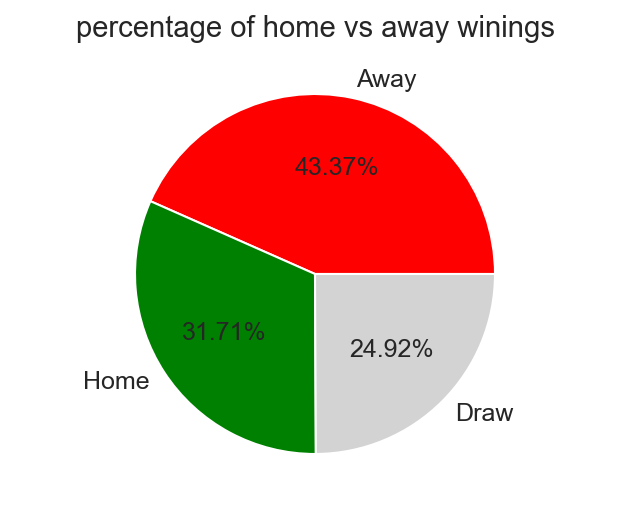

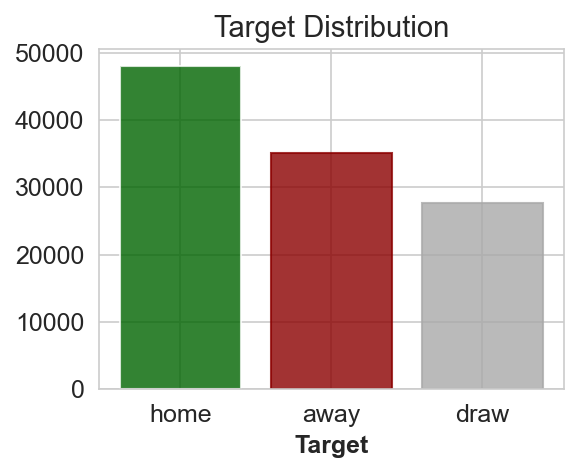

In [158]:
# percentage of home vs away winings, to see how much if you are the home team will be different

fig = plt.figure( figsize=(4,3))
ax = fig.add_axes([0,0,1,1])
ax.axis('equal')

langs = ['Away', 'Home', 'Draw']
data = [matches_df['target'].value_counts()]
ax.pie(data, labels = langs,colors=["r","g","lightgrey"],autopct='%1.2f%%')

plt.title("percentage of home vs away winings")

fig, ax = plt.subplots(1, 1, figsize=(4,3))

barplot = plt.bar(matches_df['target'].value_counts().index, matches_df['target'].value_counts(), color = 'darkgreen', alpha = 0.8)
barplot[1].set_color('darkred')
barplot[2].set_color('darkgrey')

ax.set_title('Target Distribution')

plt.xlabel('Target', fontsize = 12, weight = 'bold')
plt.show()

<hr>

## Binary features distribution (True / False)
###  To see how many current matches are cup matches to non cup matches

# add for test data too to see if it is the same dist or not

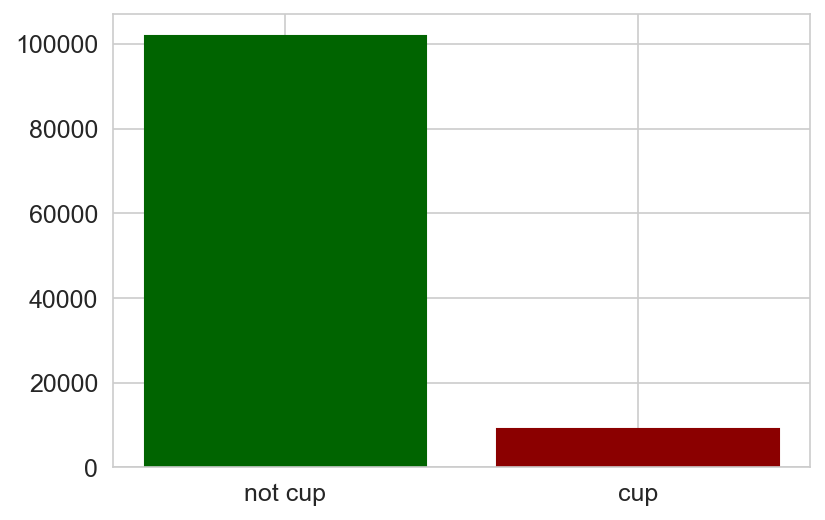

In [201]:
#  to see how many cup matches to non cup matches

matches_df = matches_df[matches_df['is_cup'] != ""]
langs = ["not cup","cup"]
data = [matches_df['is_cup'].value_counts()]
barplot = plt.bar(langs,data[0])
barplot[0].set_color('darkgreen')
barplot[1].set_color('darkred')



###  To see how many history matches are cup matches to non cup matches

<ipython-input-196-48fc38d0a0dc>:11: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  ax[i-1,j-1].pie(data, labels = langs,colors=["darkgreen","darkred"],autopct='%1.2f%%')


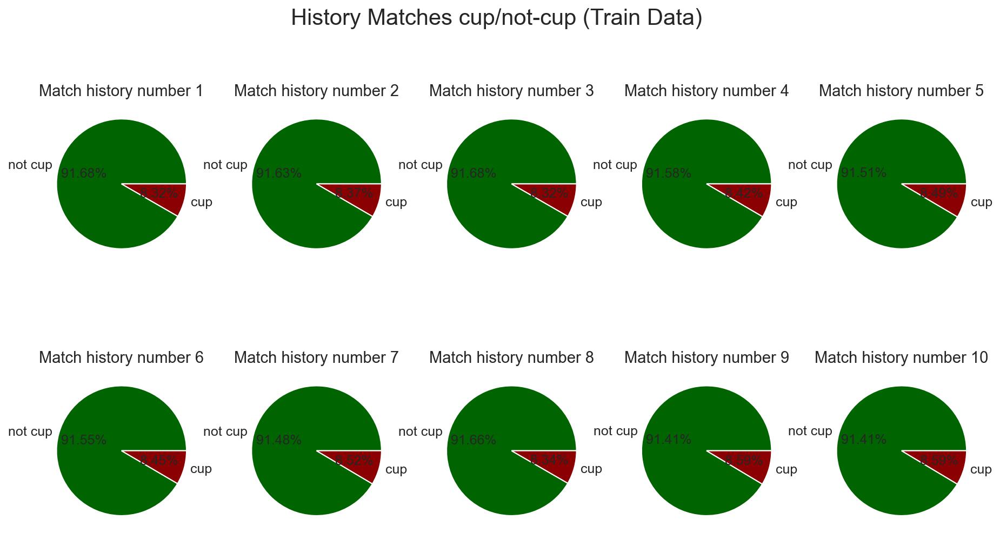

In [196]:
fig, ax = plt.subplots(2,5, figsize=(15, 8))
langs = ["not cup","cup"]
counter = 1
for i in range(1,3):
    for j in range(1,6):
        
        ax[i-1,j-1].set_title("Match history number "+str(counter))
        matches_df = matches_df[matches_df['home_team_history_is_cup_'+str(counter)] != ""]
        data = [matches_df['home_team_history_is_cup_'+str(counter)].value_counts()]
        counter+=1
        ax[i-1,j-1].pie(data, labels = langs,colors=["darkgreen","darkred"],autopct='%1.2f%%')
        
        
fig.suptitle("History Matches cup/not-cup (Train Data)", fontsize=20)
plt.show()

<ipython-input-197-0bf796a57bf6>:12: MatplotlibDeprecationWarning: Non-1D inputs to pie() are currently squeeze()d, but this behavior is deprecated since 3.1 and will be removed in 3.3; pass a 1D array instead.
  ax[i-1,j-1].pie(data, labels = langs,colors=["darkgreen","darkred"],autopct='%1.2f%%')


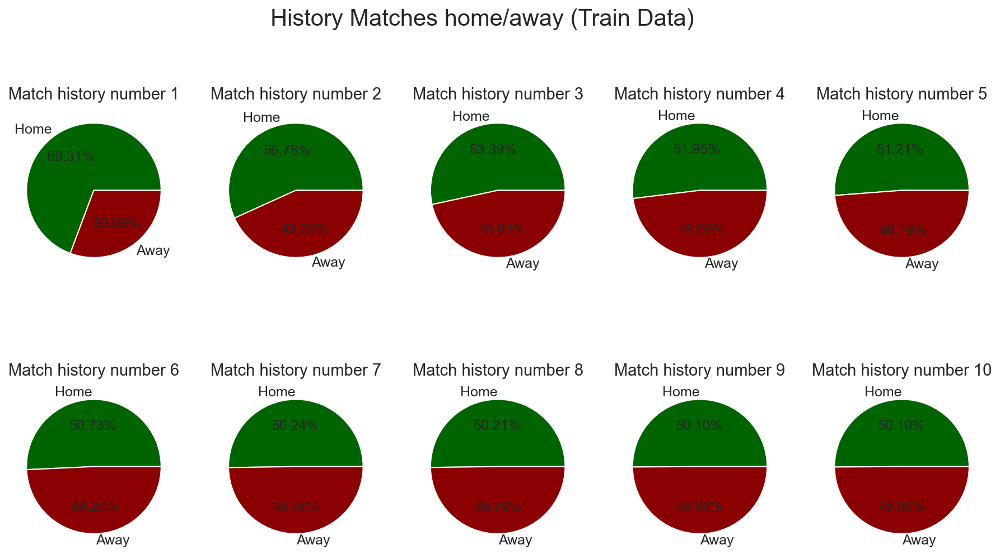

In [197]:
# history of home teams for last 10 matches if it was at home or not


langs = ['Home', 'Away']
fig, ax = plt.subplots(2, 5, figsize=(15,8))
counter = 1
for i in range(1,3):
    for j in range(1,6):
        ax[i-1,j-1].set_title("Match history number "+str(counter))
        data = [matches_df['home_team_history_is_play_home_'+str(counter)].value_counts()]
        counter+=1
        ax[i-1,j-1].pie(data, labels = langs,colors=["darkgreen","darkred"],autopct='%1.2f%%')
        
fig.suptitle("History Matches home/away (Train Data)", fontsize=20)
plt.show()


<hr>

## Ordinal features number of goals in history matches for away and home teams

In [203]:
matches_df[[f'home_team_history_goal_{i}' for i in range(1,10)]].describe(include='all')

,home_team_history_goal_1,home_team_history_goal_2,home_team_history_goal_3,home_team_history_goal_4,home_team_history_goal_5,home_team_history_goal_6,home_team_history_goal_7,home_team_history_goal_8,home_team_history_goal_9
count,109778.000000,108486.000000,107164.000000,105836.000000,104460.000000,103041.00000,101642.000000,100218.000000,98801.000000
mean,1.343311,1.409952,1.383366,1.401026,1.398124,1.39855,1.398900,1.401854,1.404976
std,1.327137,1.350368,1.337314,1.350112,1.341914,1.34523,1.335967,1.335963,1.331836
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000
75%,2.000000,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,2.000000,2.000000
max,18.000000,18.000000,18.000000,21.000000,18.000000,21.00000,15.000000,18.000000,21.000000


In [204]:
matches_df[[f'away_team_history_goal_{i}' for i in range(1,10)]].describe(include='all')

,away_team_history_goal_1,away_team_history_goal_2,away_team_history_goal_3,away_team_history_goal_4,away_team_history_goal_5,away_team_history_goal_6,away_team_history_goal_7,away_team_history_goal_8,away_team_history_goal_9
count,109711.000000,108344.000000,106903.000000,105421.000000,103937.000000,102511.000000,101070.000000,99642.000000,98175.000000
mean,1.432144,1.367644,1.397313,1.382912,1.390939,1.393294,1.395459,1.393990,1.393237
std,1.356090,1.332697,1.343386,1.329146,1.335399,1.330801,1.334026,1.329599,1.327557
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000
max,17.000000,15.000000,18.000000,18.000000,21.000000,15.000000,21.000000,21.000000,18.000000


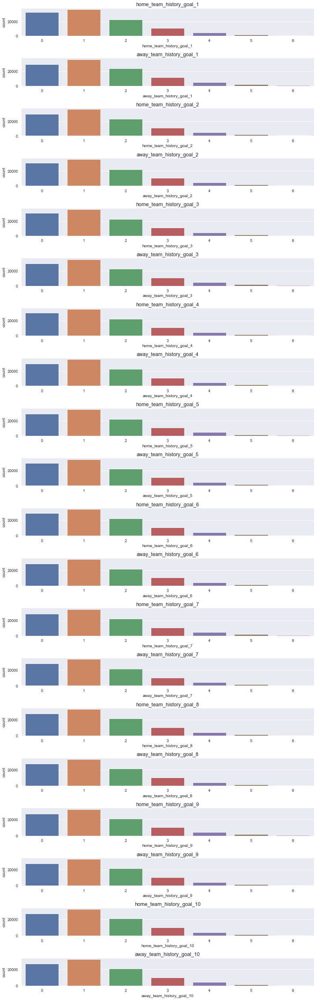

In [352]:
fig, ax = plt.subplots(20,1, figsize=(15, 50))
ord_order = [0,1,2,3,4,5,6]

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
away_counter = 1
for i in range(1,11):
    sns.countplot(f'home_team_history_goal_{home_counter}', data= matches_df, ax=ax[(home_counter+away_counter)-2],order = ord_order)
    ax[(home_counter+away_counter)-2].set_title(f'home_team_history_goal_{home_counter}', fontsize=15)
    
    
    sns.countplot(f'away_team_history_goal_{away_counter}', data= matches_df, ax=ax[(home_counter+away_counter)-1],order = ord_order)
    ax[(home_counter+away_counter)-1].set_title(f'away_team_history_goal_{away_counter}', fontsize=15)
    
    away_counter+=1
    home_counter+=1

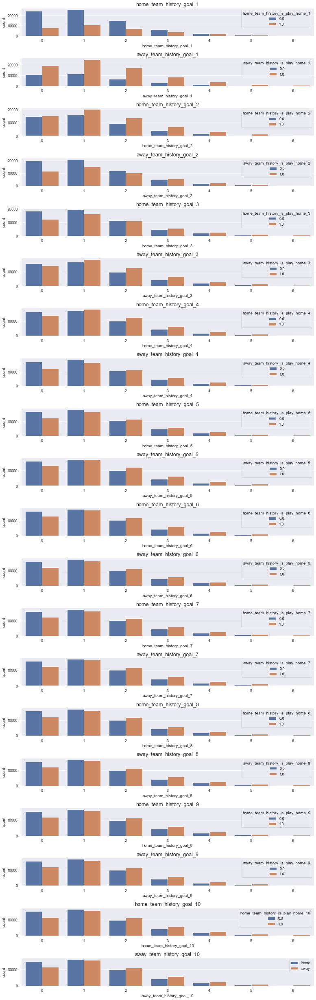

In [354]:
fig, ax = plt.subplots(20,1, figsize=(15, 50))
ord_order = [0,1,2,3,4,5,6]

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
away_counter = 1
for i in range(1,11):
    sns.countplot(f'home_team_history_goal_{home_counter}',hue = f'home_team_history_is_play_home_{home_counter}', data= matches_df, ax=ax[(home_counter+away_counter)-2],order = ord_order)
    ax[(home_counter+away_counter)-2].set_title(f'home_team_history_goal_{home_counter}', fontsize=15)
    
    
    sns.countplot(f'away_team_history_goal_{away_counter}',hue = f'away_team_history_is_play_home_{away_counter}', data= matches_df, ax=ax[(home_counter+away_counter)-1],order = ord_order)
    ax[(home_counter+away_counter)-1].set_title(f'away_team_history_goal_{away_counter}', fontsize=15)
#     plt.legend(["home","away"])
    away_counter+=1
    home_counter+=1

## Number of goals in history matches for home and oponent teams

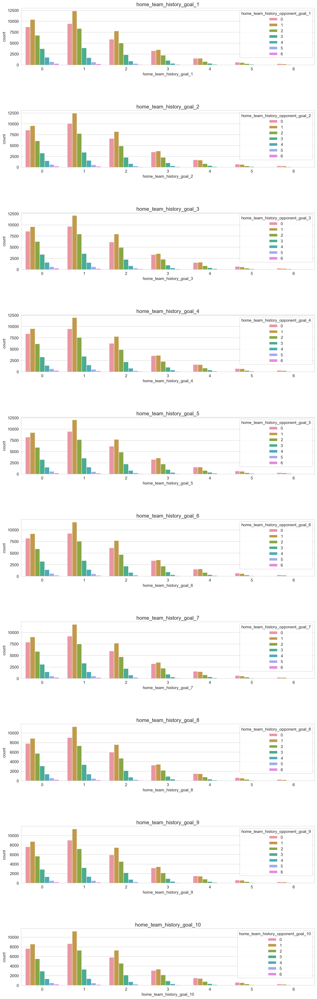

In [278]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))
ord_order = [0,1,2,3,4,5,6]

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
away_counter = 1
for i in range(1,11):
    sns.countplot(f'home_team_history_goal_{home_counter}',hue = f'home_team_history_opponent_goal_{home_counter}', data= matches_df, ax=ax[(home_counter)-1],order = ord_order, hue_order = ord_order)
    ax[(home_counter)-1].set_title(f'home_team_history_goal_{home_counter}', fontsize=15)
    
    home_counter+=1

## Number of goals in history matches for away and oponent teams

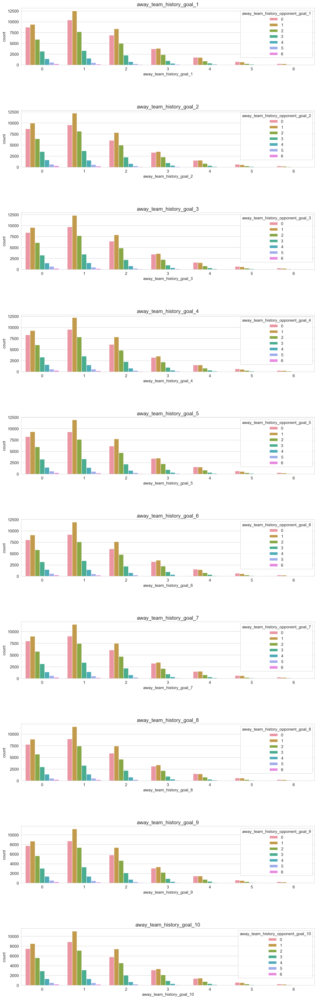

In [279]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))
ord_order = [0,1,2,3,4,5,6]

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
away_counter = 1
for i in range(1,11):
    sns.countplot(f'away_team_history_goal_{home_counter}',hue = f'away_team_history_opponent_goal_{home_counter}', data= matches_df, ax=ax[(home_counter)-1],order = ord_order, hue_order = ord_order)
    ax[(home_counter)-1].set_title(f'away_team_history_goal_{home_counter}', fontsize=15)
    
    home_counter+=1

<hr>
<hr>

# *Outliers Detection*

<hr>

## Team rating for history matches distribution

In [334]:
# i goes from 1 to 10
# so for 8 columns X 10 i's = 80 columns that include outliers

# home_team_history_goal_i
# away_team_history_goal_i
# home_team_history_opponent_goal_i
# away_team_history_opponent_goal_i
# home_team_history_rating_i
# away_team_history_rating_i
# home_team_history_opponent_rating_i
# away_team_history_opponent_rating_i

In [335]:
matches_df['home_team_history_rating_1'].describe()

count    109766.000000
mean          6.325515
std           2.670837
min           0.217600
25%           4.616938
50%           5.690304
75%           7.290471
max          57.861050
Name: home_team_history_rating_1, dtype: float64

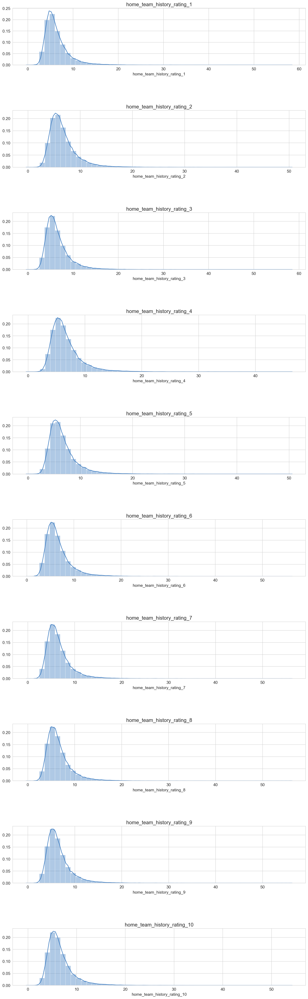

In [288]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.distplot(matches_df[f'home_team_history_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'home_team_history_rating_{home_counter}', fontsize=15)
    
    home_counter+=1

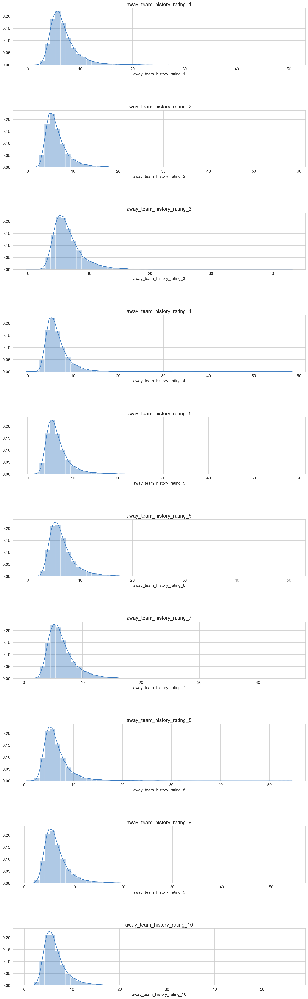

In [291]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.distplot(matches_df[f'away_team_history_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'away_team_history_rating_{home_counter}', fontsize=15)
    
    home_counter+=1

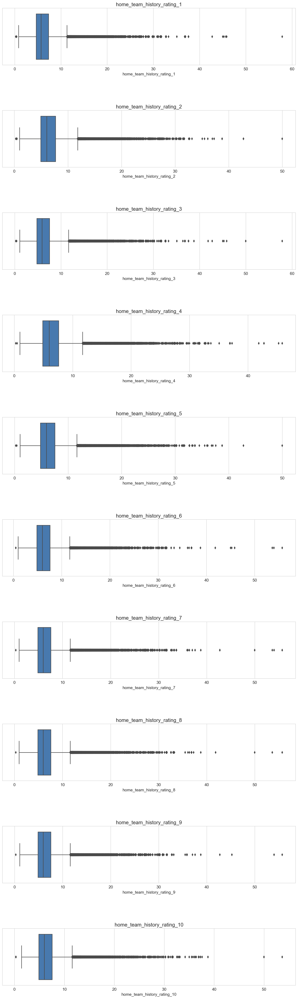

In [295]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'home_team_history_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'home_team_history_rating_{home_counter}', fontsize=15)
    
    home_counter+=1

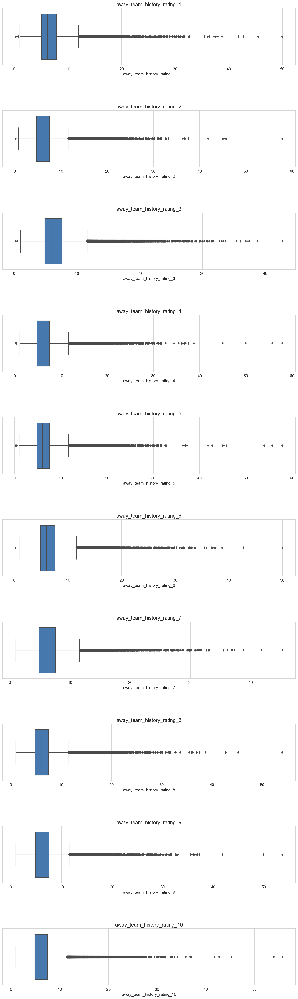

In [294]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'away_team_history_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'away_team_history_rating_{home_counter}', fontsize=15)
    
    home_counter+=1

## Team goals for history matches distribution

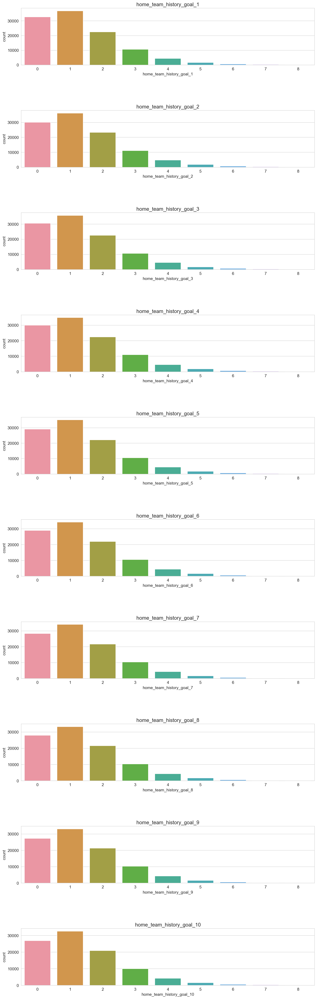

In [313]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

ord_order = [0,1,2,3,4,5,6,7,8]
plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.countplot(matches_df[f'home_team_history_goal_{home_counter}'],ax=ax[(home_counter)-1],order =ord_order);
    ax[(home_counter)-1].set_title(f'home_team_history_goal_{home_counter}', fontsize=15)
    
    home_counter+=1
    
    

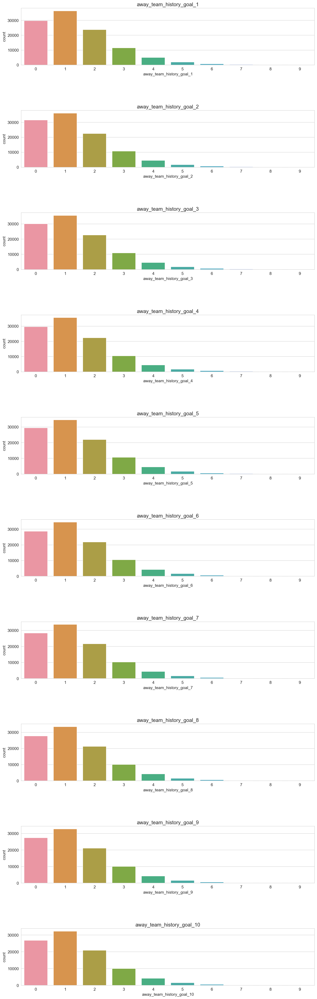

In [312]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

ord_order = [0,1,2,3,4,5,6,7,8]

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.countplot(matches_df[f'away_team_history_goal_{home_counter}'],ax=ax[(home_counter)-1],order =ord_order)
    ax[(home_counter)-1].set_title(f'away_team_history_goal_{home_counter}', fontsize=15)
    
    home_counter+=1

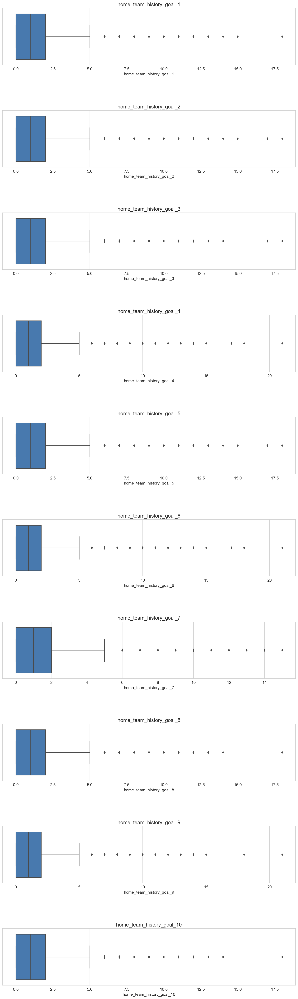

In [303]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'home_team_history_goal_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'home_team_history_goal_{home_counter}', fontsize=15)
    
    home_counter+=1

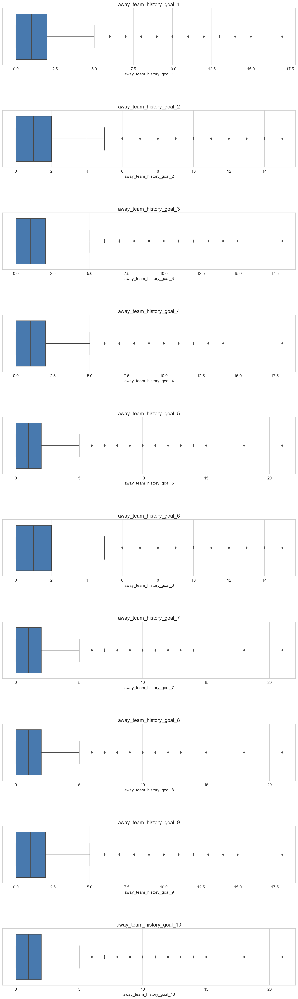

In [304]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'away_team_history_goal_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'away_team_history_goal_{home_counter}', fontsize=15)
    
    home_counter+=1

## Team rating for history oppoenent matches distribution

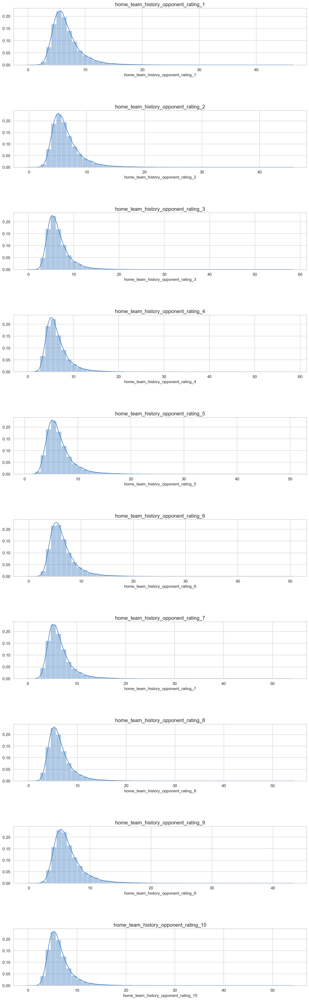

In [338]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.distplot(matches_df[f'home_team_history_opponent_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'home_team_history_opponent_rating_{home_counter}', fontsize=15)
    
    home_counter+=1



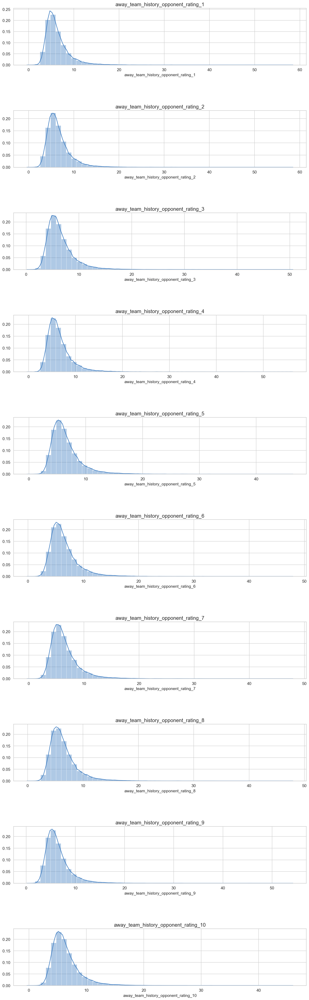

In [339]:

fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.distplot(matches_df[f'away_team_history_opponent_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'away_team_history_opponent_rating_{home_counter}', fontsize=15)
    
    home_counter+=1

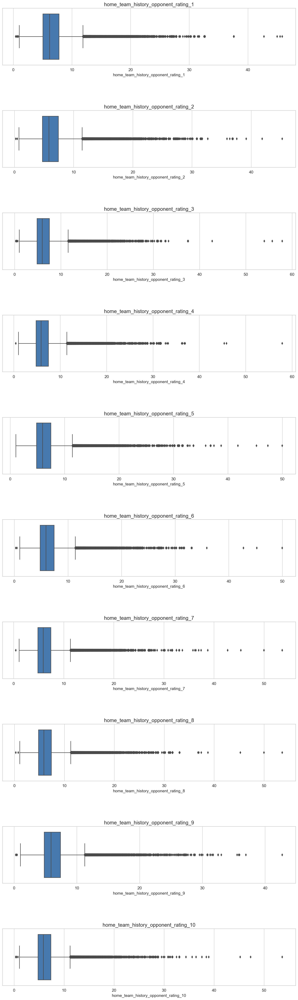

In [340]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'home_team_history_opponent_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'home_team_history_opponent_rating_{home_counter}', fontsize=15)
    
    home_counter+=1


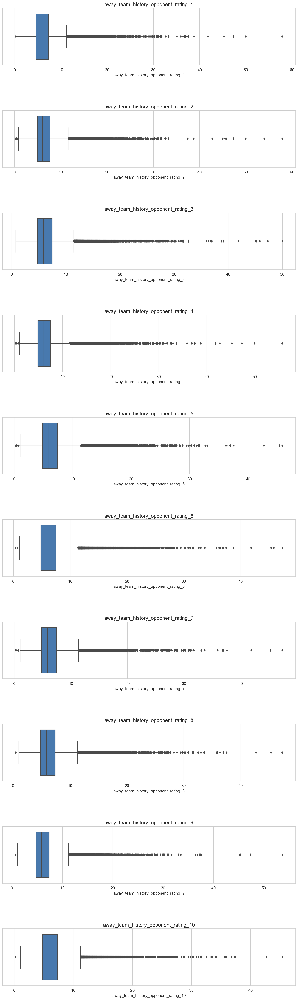

In [341]:

fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'away_team_history_opponent_rating_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'away_team_history_opponent_rating_{home_counter}', fontsize=15)
    
    home_counter+=1

## Team Goals for history oppoenent matches distribution

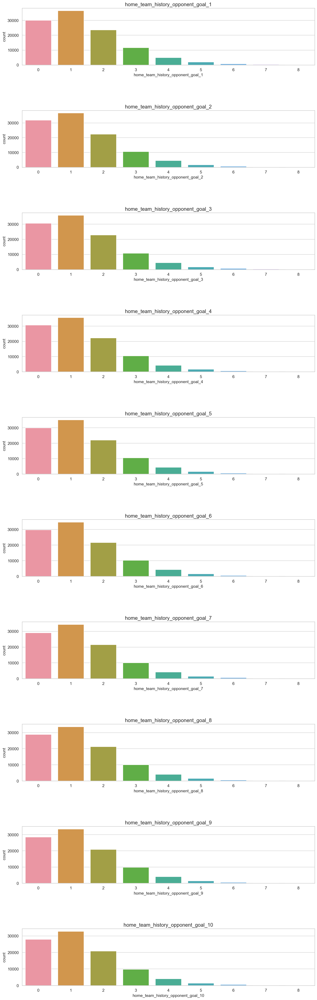

In [342]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

ord_order = [0,1,2,3,4,5,6,7,8]
plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.countplot(matches_df[f'home_team_history_opponent_goal_{home_counter}'],ax=ax[(home_counter)-1],order =ord_order);
    ax[(home_counter)-1].set_title(f'home_team_history_opponent_goal_{home_counter}', fontsize=15)
    
    home_counter+=1
    
    

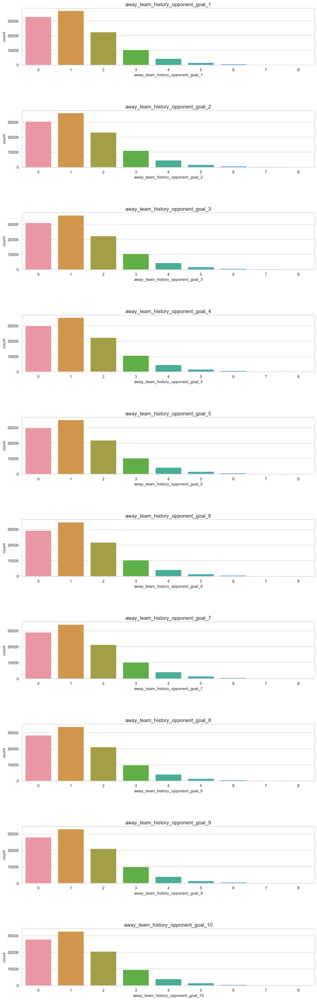

In [343]:

fig, ax = plt.subplots(10,1, figsize=(15, 50))

ord_order = [0,1,2,3,4,5,6,7,8]

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.countplot(matches_df[f'away_team_history_opponent_goal_{home_counter}'],ax=ax[(home_counter)-1],order =ord_order)
    ax[(home_counter)-1].set_title(f'away_team_history_opponent_goal_{home_counter}', fontsize=15)
    
    home_counter+=1

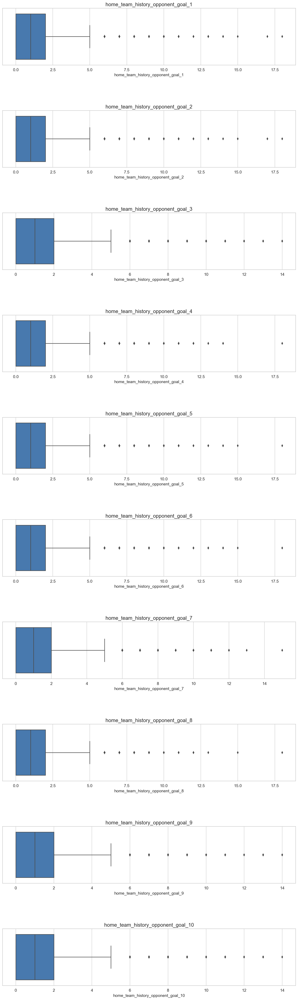

In [344]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'home_team_history_opponent_goal_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'home_team_history_opponent_goal_{home_counter}', fontsize=15)
    
    home_counter+=1


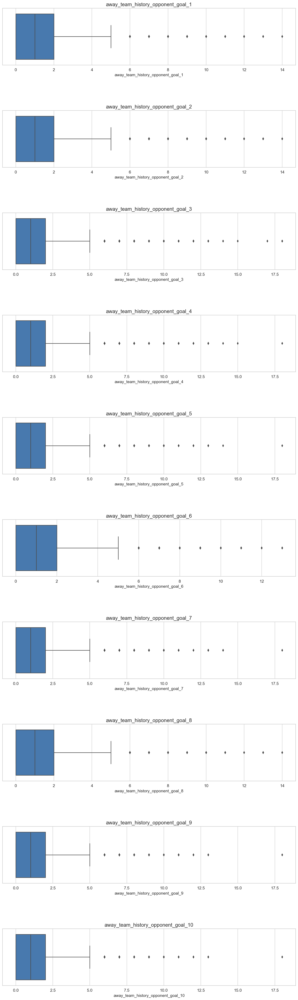

In [345]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    sns.boxplot(matches_df[f'away_team_history_opponent_goal_{home_counter}'],ax=ax[(home_counter)-1]);
    ax[(home_counter)-1].set_title(f'away_team_history_opponent_goal_{home_counter}', fontsize=15)
    
    home_counter+=1

# End of outliers detection
# ------------------------------------------------------------------------------------------------------

## Team Goals VS Team Ratings for history matches distribution

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

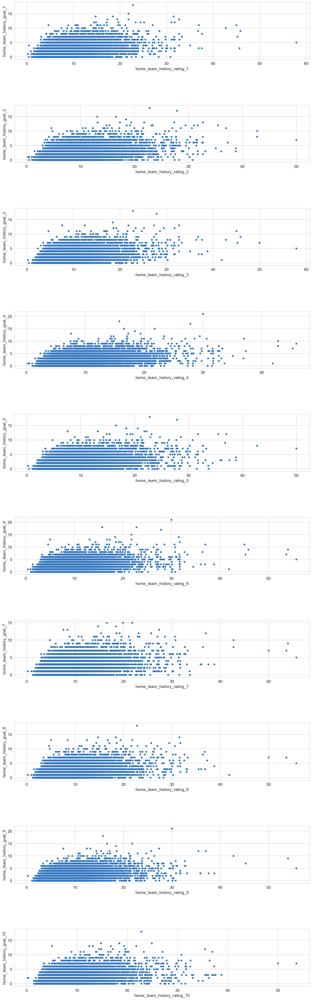

In [321]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    matches_df.plot.scatter(x=f'home_team_history_rating_{home_counter}',y=f'home_team_history_goal_{home_counter}',ax=ax[(home_counter)-1]);
#     ax[(home_counter)-1].set_title(f'home_team_history_rating_{home_counter}', fontsize=15)
    
    home_counter+=1

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

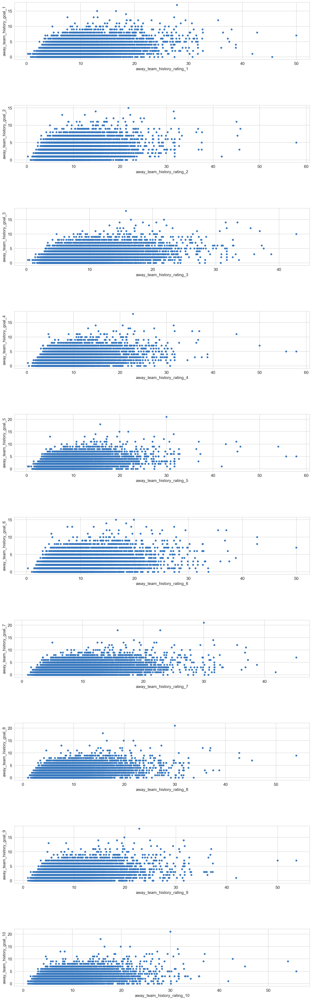

In [320]:
fig, ax = plt.subplots(10,1, figsize=(15, 50))

plt.subplots_adjust(left=0.1,bottom=0.1, right=0.9, top=0.9, wspace=0.4, hspace=0.8)

home_counter = 1
for i in range(1,11):
    matches_df.plot.scatter(x=f'away_team_history_rating_{home_counter}',y=f'away_team_history_goal_{home_counter}',ax=ax[(home_counter)-1]);
    
    home_counter+=1

# Pair plot for all numerical features

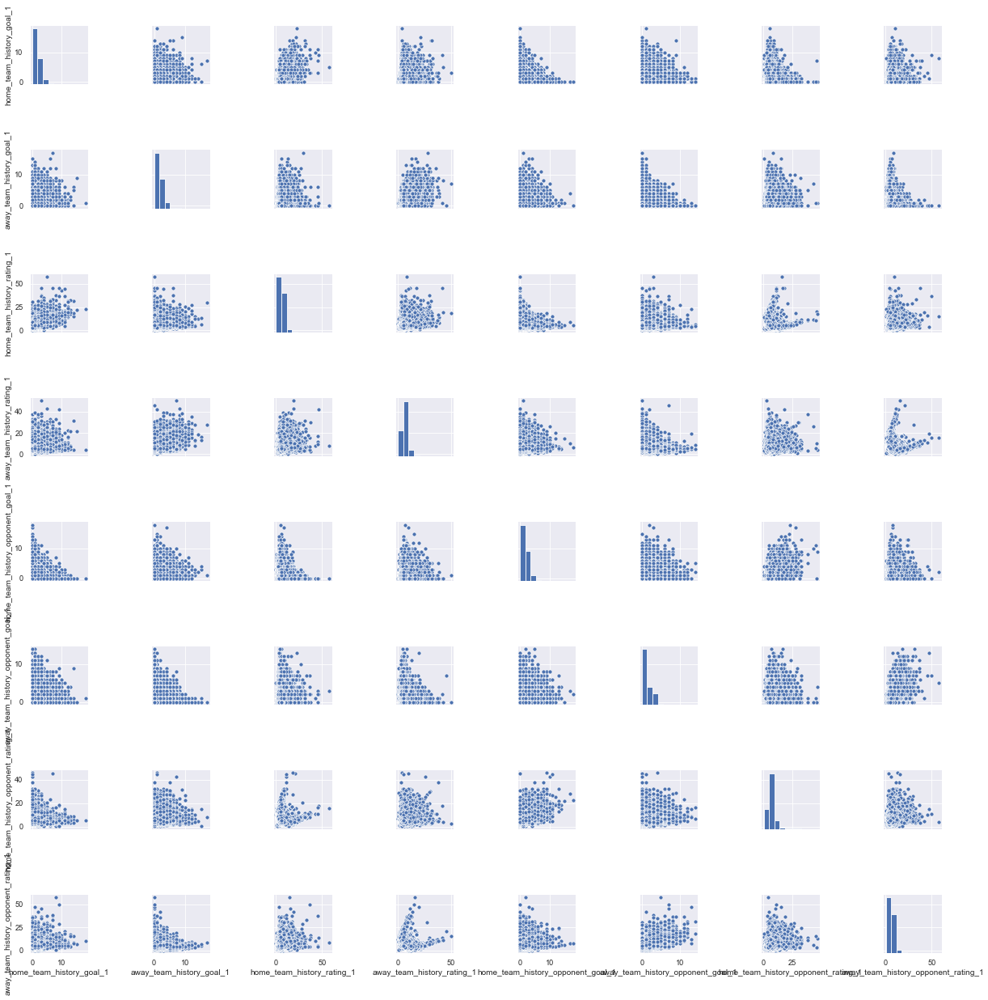

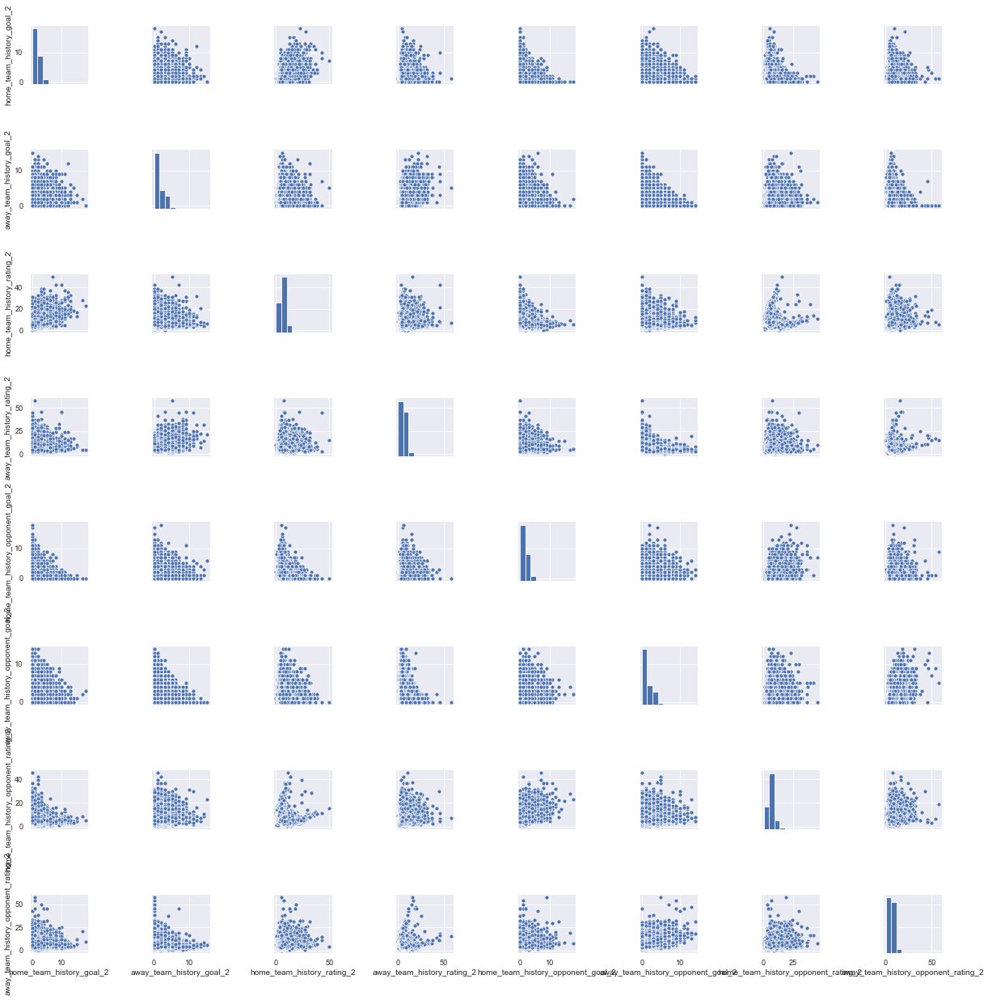

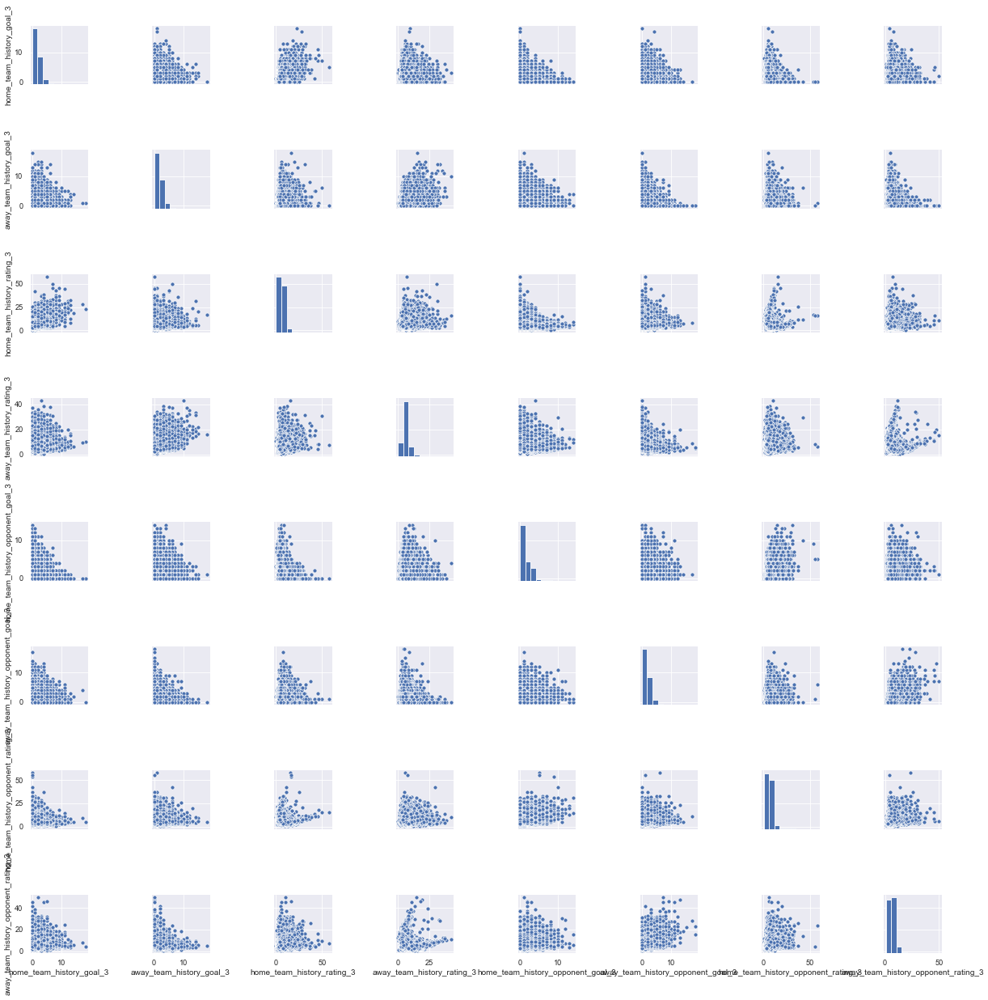

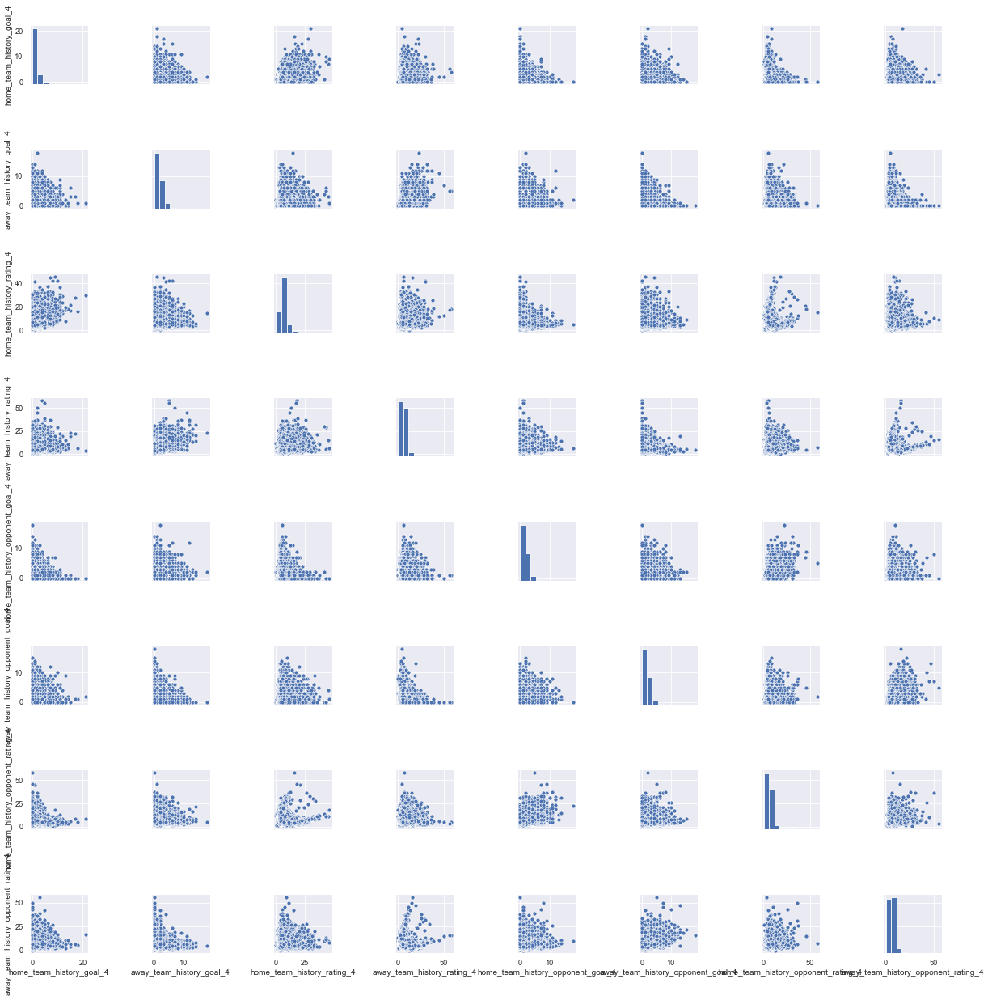

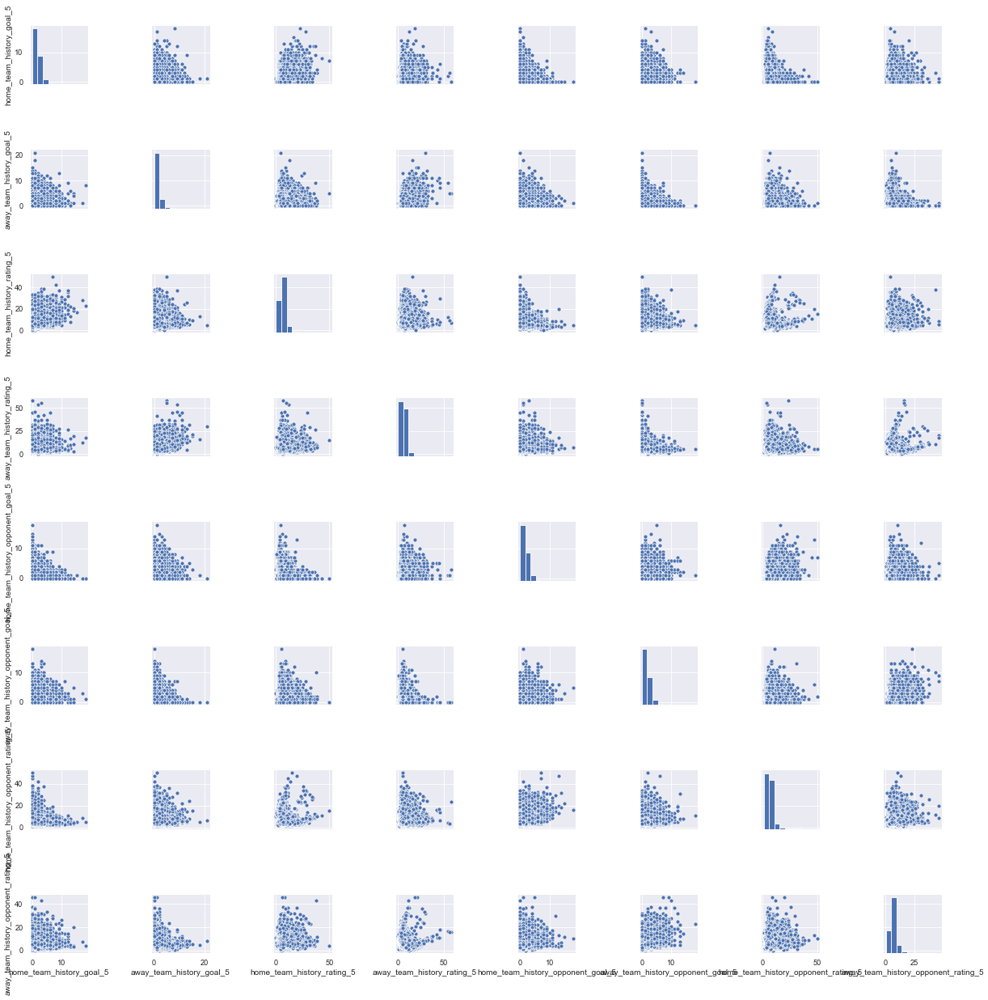

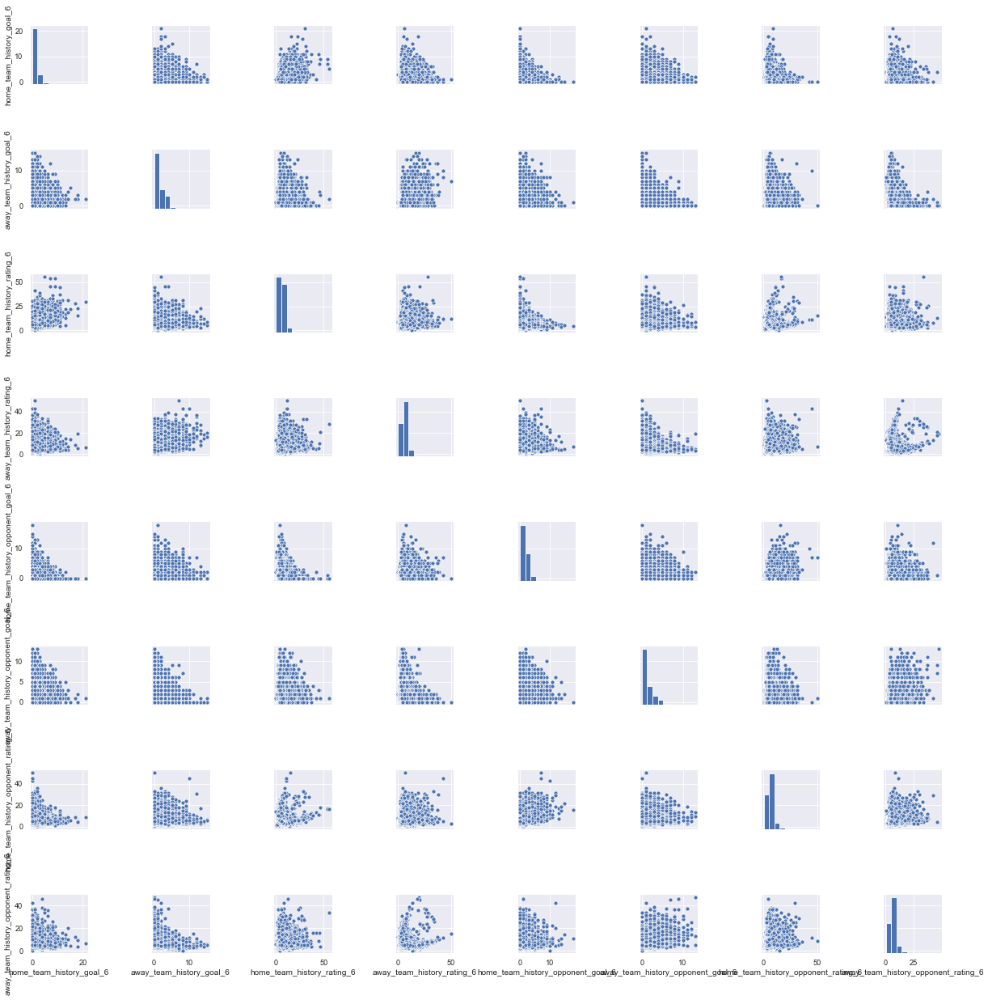

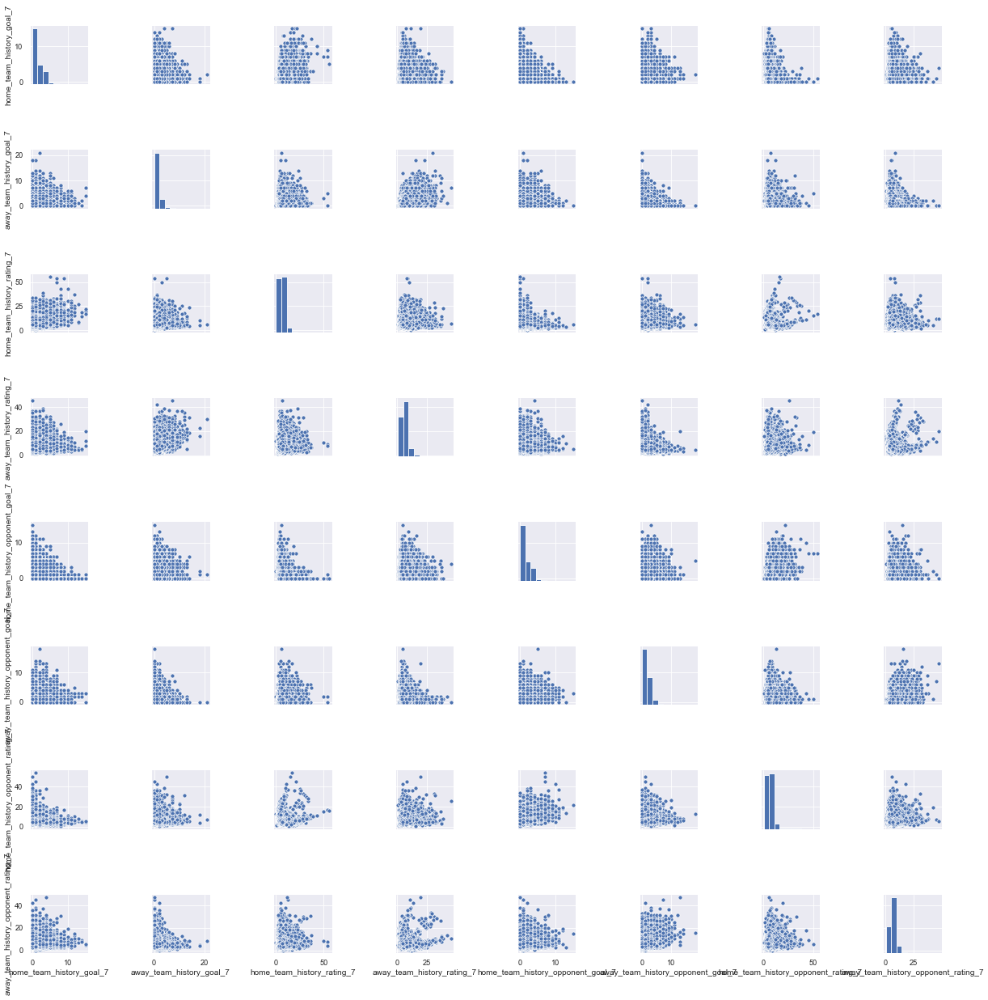

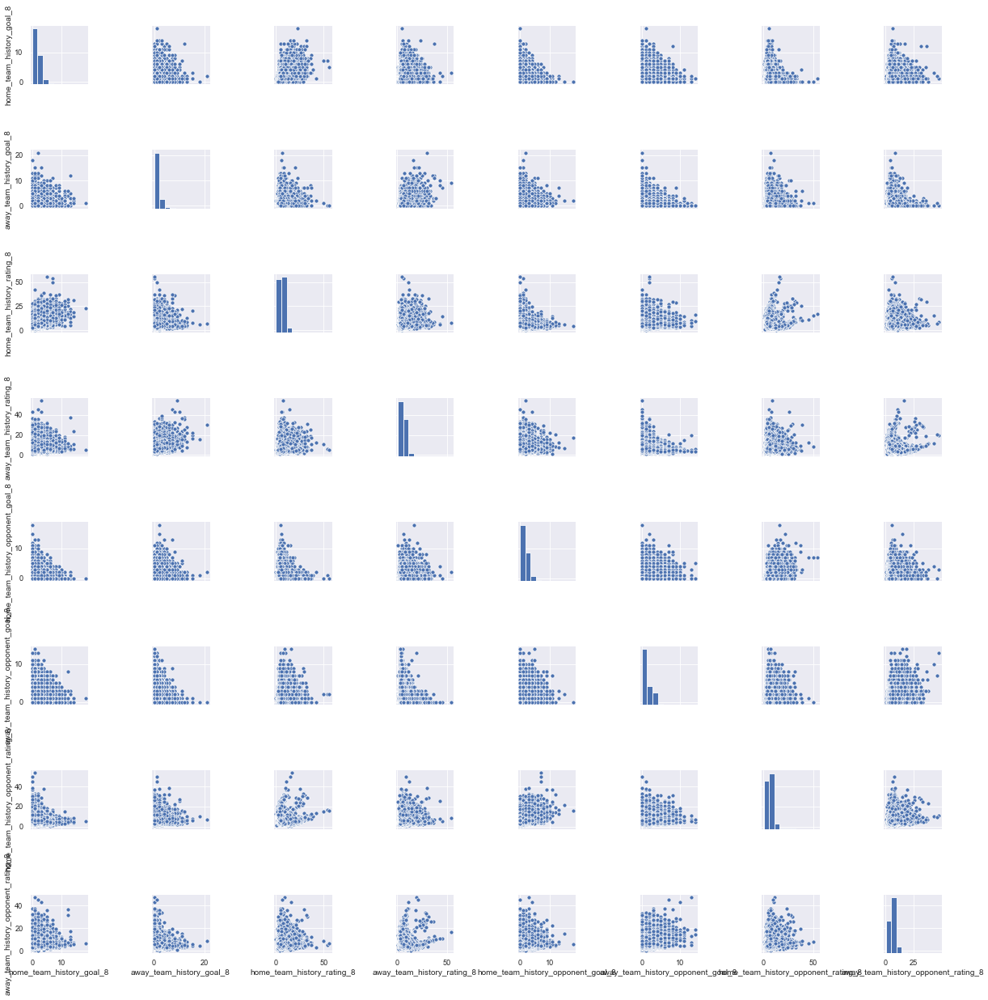

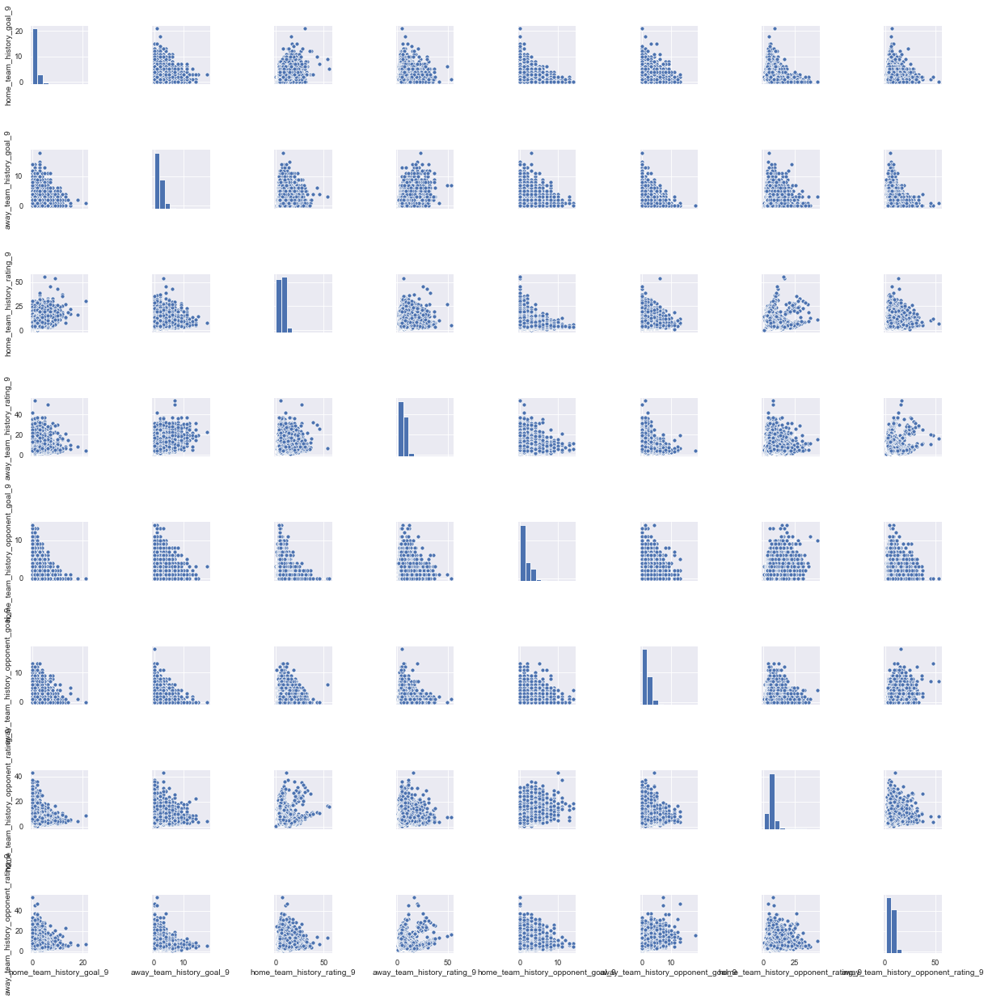

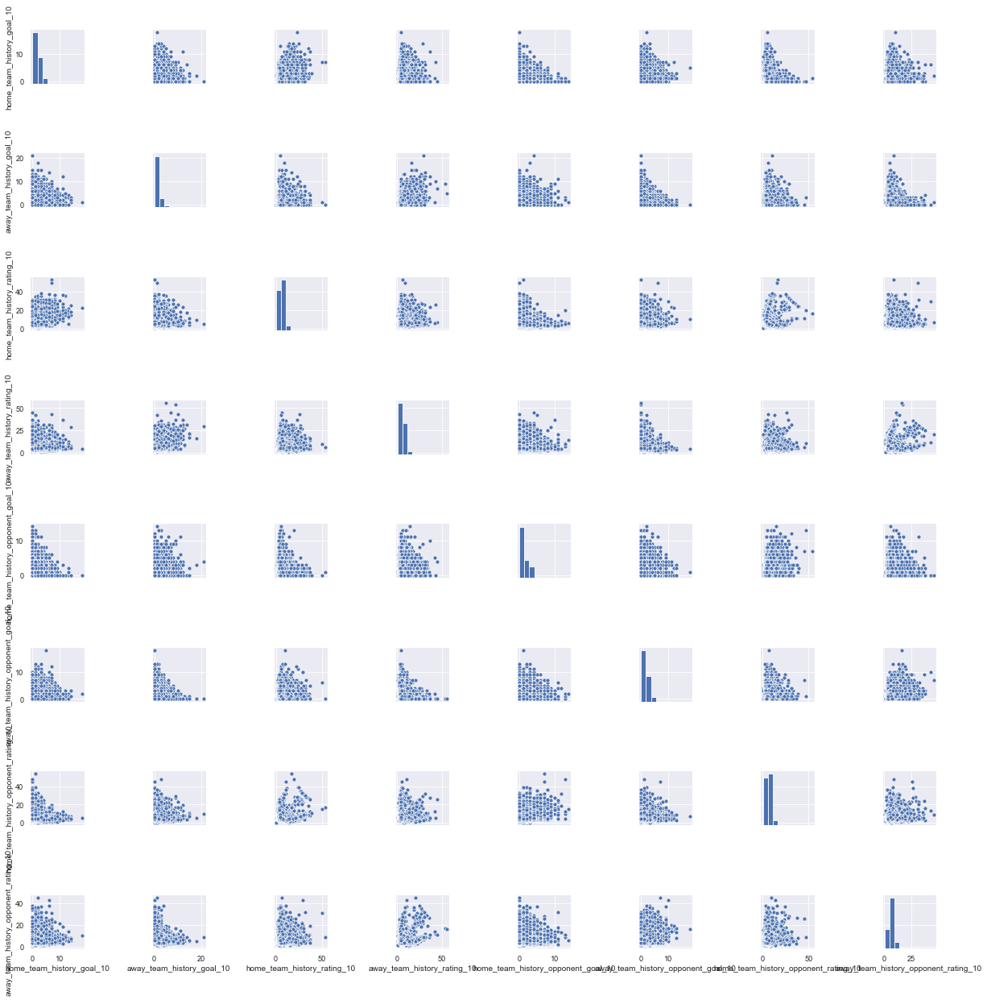

In [347]:

plt.rcParams['figure.dpi'] = 60
sns.set()
# home_team_history_goal_i
# away_team_history_goal_i
# home_team_history_opponent_goal_i
# away_team_history_opponent_goal_i
# home_team_history_rating_i
# away_team_history_rating_i
# home_team_history_opponent_rating_i
# away_team_history_opponent_rating_i
home_counter = 1
for i in range(1,11):
    cols = [f"home_team_history_goal_{home_counter}",f"away_team_history_goal_{home_counter}",f"home_team_history_rating_{home_counter}",f"away_team_history_rating_{home_counter}"
            ,f"home_team_history_opponent_goal_{home_counter}",f"away_team_history_opponent_goal_{home_counter}",f"home_team_history_opponent_rating_{home_counter}",f"away_team_history_opponent_rating_{home_counter}"]
    sns.pairplot(matches_df[cols], height = 2.5)
    home_counter+=1
    plt.show()

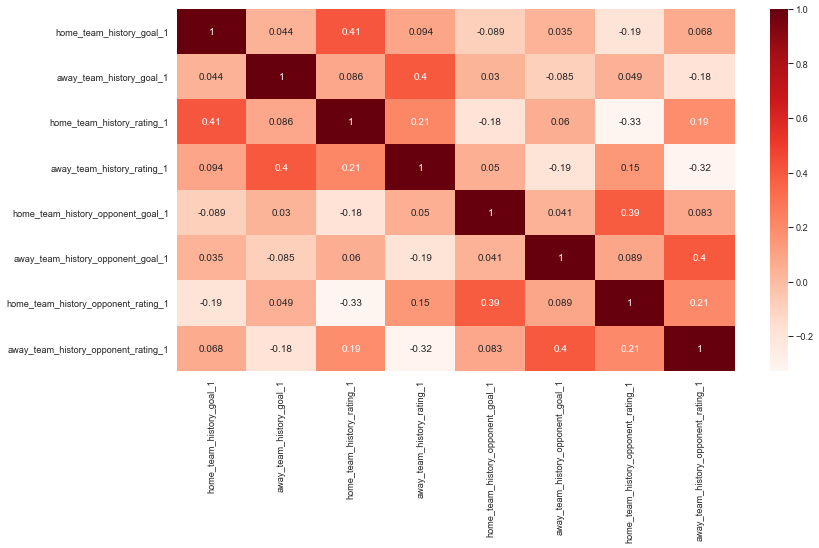

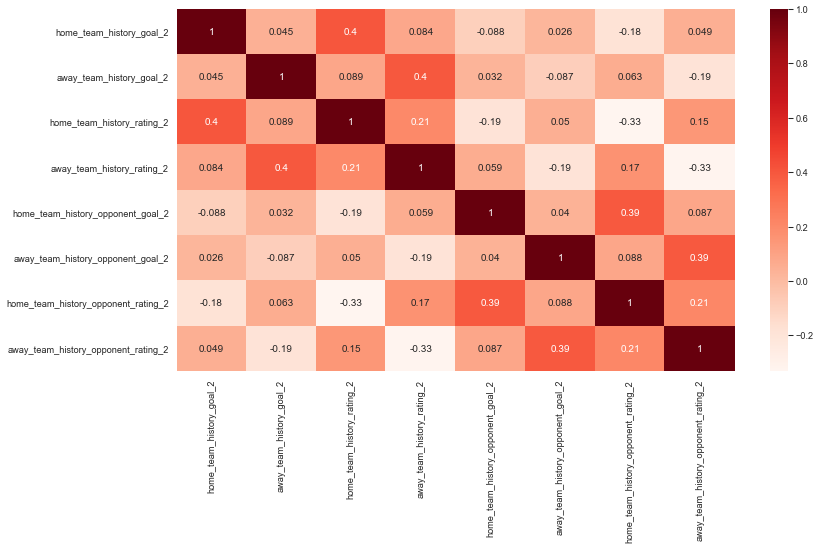

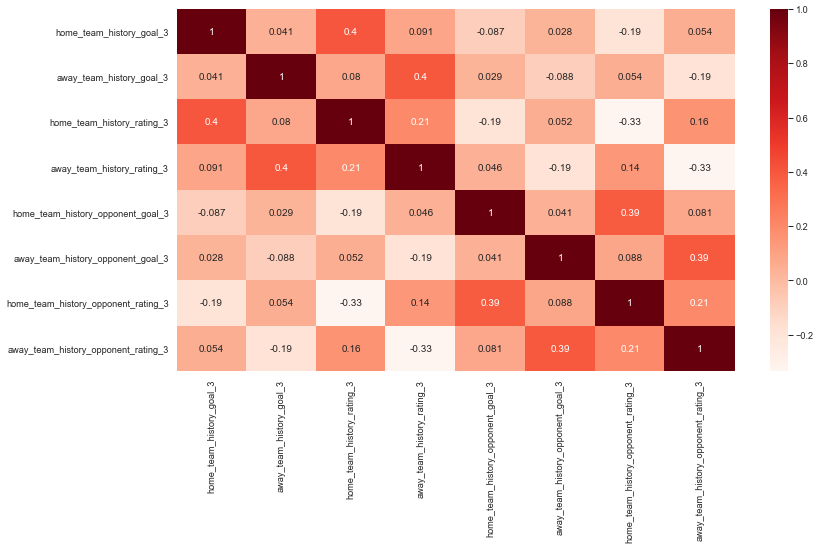

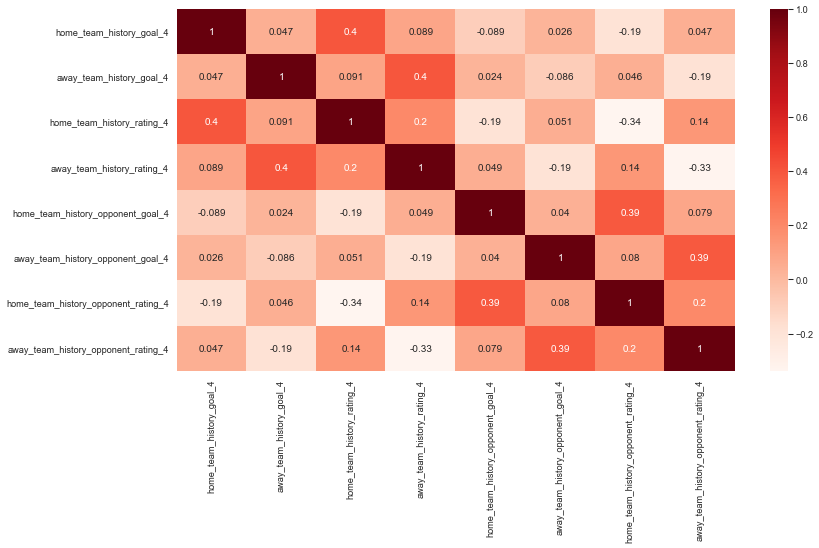

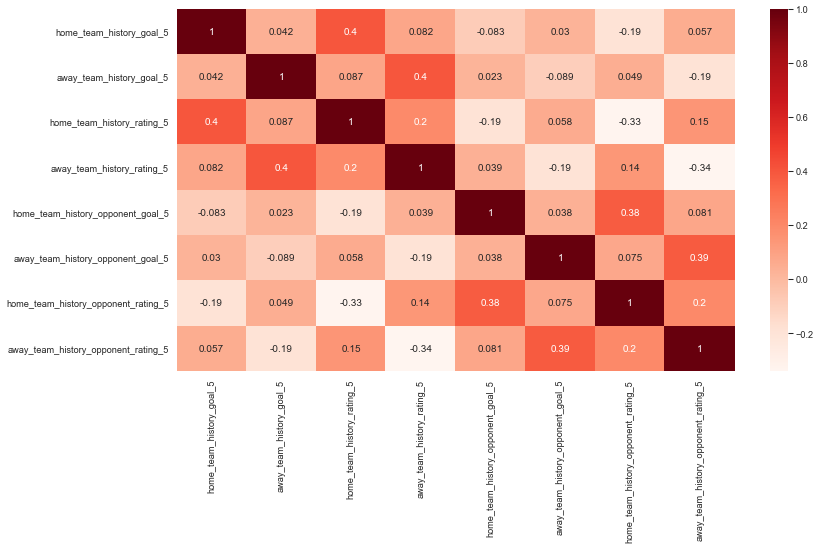

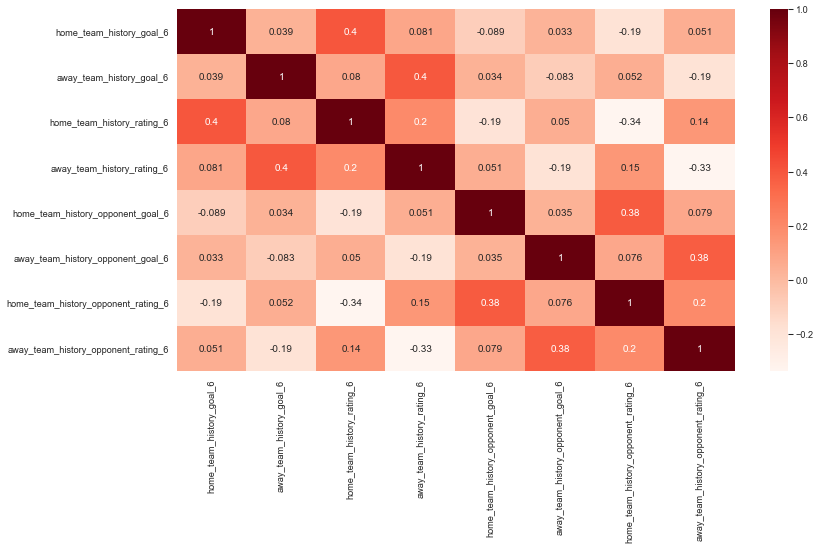

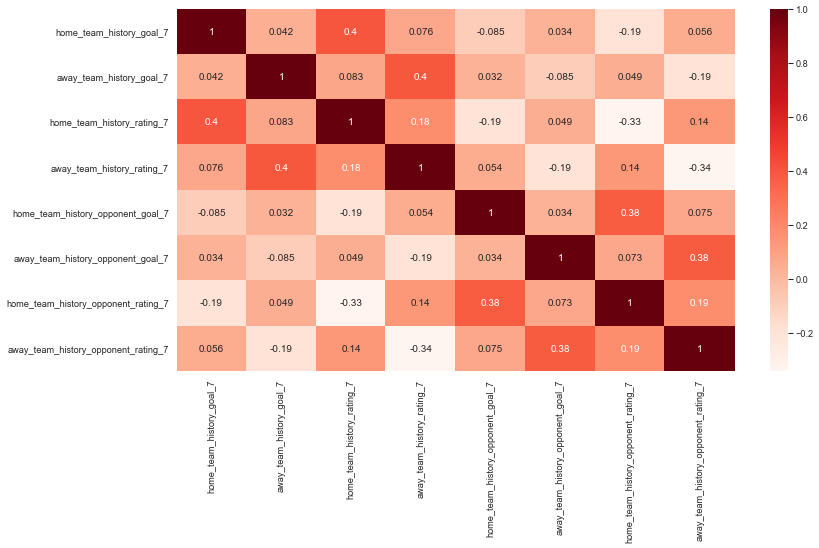

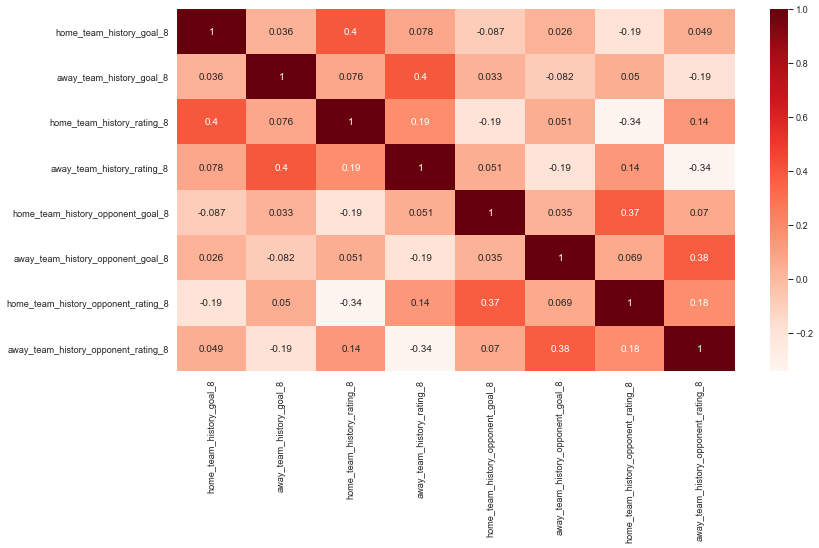

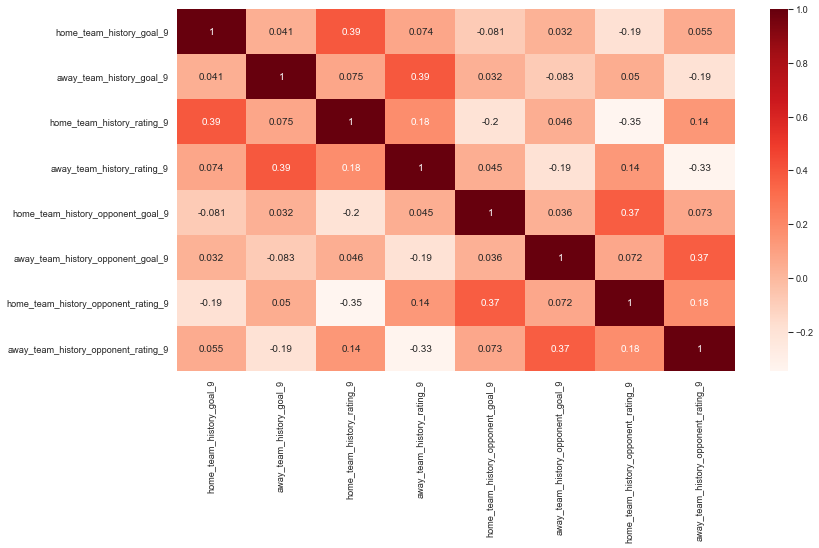

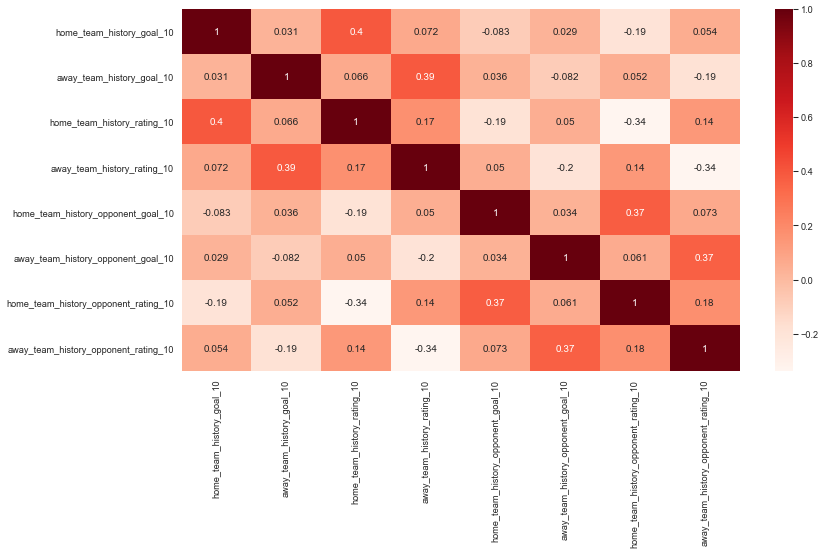

In [359]:
sns.set(rc={"figure.figsize":(15, 8)}) 

home_counter = 1
for i in range(1,11):
    cols = [f"home_team_history_goal_{home_counter}",f"away_team_history_goal_{home_counter}",f"home_team_history_rating_{home_counter}",f"away_team_history_rating_{home_counter}"
            ,f"home_team_history_opponent_goal_{home_counter}",f"away_team_history_opponent_goal_{home_counter}",f"home_team_history_opponent_rating_{home_counter}",f"away_team_history_opponent_rating_{home_counter}"]
    
    sns.heatmap(matches_df[cols].corr(),annot=True,cmap="Reds")
    home_counter+=1
    plt.show()
